In [13]:
# Import libraries

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None
#Read the data

df= pd.read_csv(r'C:\Users\alexa\Downloads\movies.csv')
            


In [6]:
#Let's look at the data

df.head()


,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [7]:
#Let's see if there is any missing data

for col in df.columns:
    pct_missing= np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0%
rating - 1%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 28%
gross - 2%
company - 0%
runtime - 0%


In [8]:
#Data types for our columns

print(df.dtypes)


name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object


In [73]:
# Create correct Year column

df['yearcorrect'] = df['released'].astype(str).str[:4]
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect,Year
5445,386,5,0,2009,527,7.8,1100000.0,785,1263,1534,47,237000000.0,2.847246e+09,1382,162.0,527,527
7445,388,5,0,2019,137,8.4,903000.0,105,513,1470,47,356000000.0,2.797501e+09,983,181.0,137,137
3045,4909,5,6,1997,534,7.8,1100000.0,785,1263,1073,47,200000000.0,2.201647e+09,1382,194.0,534,534
6663,3643,5,0,2015,529,7.8,876000.0,768,1806,356,47,245000000.0,2.069522e+09,945,138.0,529,529
7244,389,5,0,2018,145,8.4,897000.0,105,513,1470,47,321000000.0,2.048360e+09,983,149.0,145,145
7480,4388,4,2,2019,1126,6.9,222000.0,1012,1361,457,47,260000000.0,1.670728e+09,1423,118.0,1126,1126
6653,2117,5,0,2015,1303,7.0,593000.0,335,2523,293,47,150000000.0,1.670516e+09,1397,124.0,1303,1303
6043,3878,5,0,2012,1899,8.0,1300000.0,1060,1646,1470,47,220000000.0,1.518816e+09,983,143.0,1899,1899
6646,1541,5,0,2015,165,7.1,370000.0,809,481,1785,47,190000000.0,1.515341e+09,1397,137.0,165,165
7494,1530,4,2,2019,2053,6.8,148000.0,277,1383,1036,47,150000000.0,1.450027e+09,1422,103.0,2053,2053


In [35]:
df = df.sort_values(by=['gross'], inplace=False, ascending=False)

In [28]:
pd.set_option('display.max_rows', None)

<AxesSubplot:>

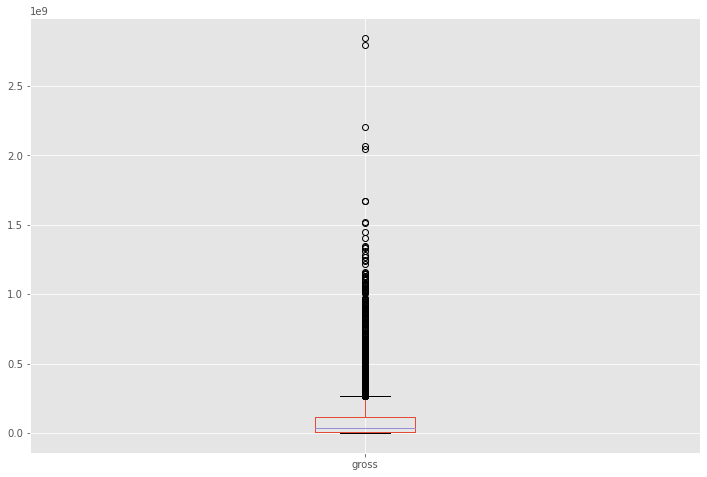

In [29]:
# Are there any Outliers?

df.boxplot(column=['gross'])


In [30]:

#Drop any duplicates 

df['company'].drop_duplicates()


0                                            Warner Bros.
1                                       Columbia Pictures
2                                               Lucasfilm
3                                      Paramount Pictures
4                                          Orion Pictures
6                                      Universal Pictures
7                            Chartoff-Winkler Productions
8                                          Dovemead Films
9                                          United Artists
10                                    The Malpaso Company
11                                           C.A.T. Films
14                                      Filmways Pictures
15                                        Rastar Pictures
17                                              IPC Films
18                                  AVCO Embassy Pictures
20                             Lorimar Film Entertainment
21                                   Partisan Productions
22            

In [31]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,4.699877e+07,Warner Bros.,146.0,June
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,5.885311e+07,Columbia Pictures,104.0,July
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,5.383751e+08,Lucasfilm,124.0,June
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,8.345354e+07,Paramount Pictures,88.0,July
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,3.984634e+07,Orion Pictures,98.0,July
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000.0,3.975460e+07,Paramount Pictures,95.0,May
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000.0,1.152299e+08,Universal Pictures,133.0,June
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000.0,2.340243e+07,Chartoff-Winkler Productions,129.0,Dece
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000.0,1.081857e+08,Dovemead Films,127.0,June
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000.0,1.579519e+07,United Artists,100.0,May


In [32]:
#Budget high correlation
#Company high correlation


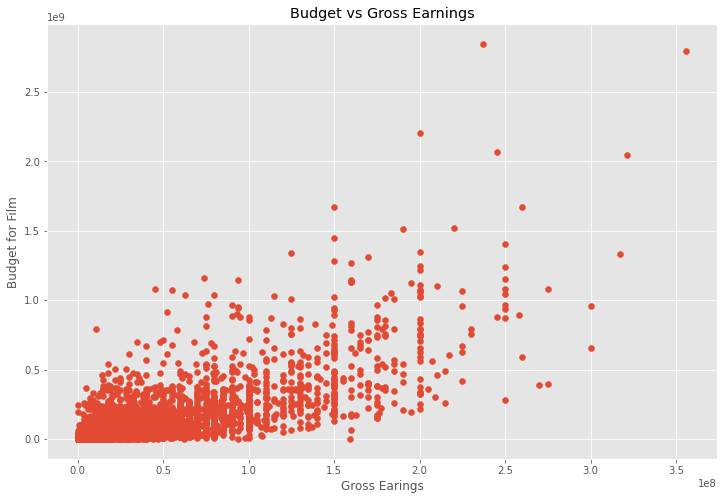

In [36]:
# Scatter plot with budget vs gros

plt.scatter(x=df['budget'], y=df['gross'])
plt.title('Budget vs Gross Earnings')
plt.xlabel('Gross Earings')
plt.ylabel('Budget for Film')

plt.show()

In [37]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000.0,2.847246e+09,Twentieth Century Fox,162.0,Dece
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000.0,2.797501e+09,Marvel Studios,181.0,Apri
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000.0,2.201647e+09,Twentieth Century Fox,194.0,Dece
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000.0,2.069522e+09,Lucasfilm,138.0,Dece
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000.0,2.048360e+09,Marvel Studios,149.0,Apri


<AxesSubplot:xlabel='budget', ylabel='gross'>

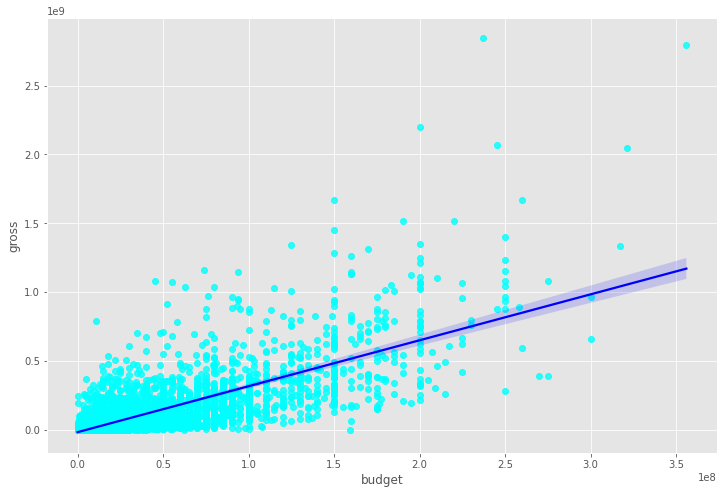

In [43]:
# Plot budget vs gross using seaborn

sns.regplot(x='budget', y='gross', data=df, scatter_kws={"color":"cyan"}, line_kws={"color":"blue"})

In [44]:
# Let's start looking at correlation

In [46]:
df.corr(method = 'pearson')

,year,score,votes,budget,gross,runtime
year,1.000000,0.056386,0.206021,0.327722,0.274321,0.075077
score,0.056386,1.000000,0.474256,0.072001,0.222556,0.414068
votes,0.206021,0.474256,1.000000,0.439675,0.614751,0.352303
budget,0.327722,0.072001,0.439675,1.000000,0.740247,0.318695
gross,0.274321,0.222556,0.614751,0.740247,1.000000,0.275796
runtime,0.075077,0.414068,0.352303,0.318695,0.275796,1.000000


In [47]:
df.corr(method = 'kendall')

,year,score,votes,budget,gross,runtime
year,1.000000,0.039389,0.296512,0.220833,0.239539,0.064824
score,0.039389,1.000000,0.350185,-0.006406,0.124943,0.292254
votes,0.296512,0.350185,1.000000,0.346274,0.553625,0.205344
budget,0.220833,-0.006406,0.346274,1.000000,0.512057,0.231278
gross,0.239539,0.124943,0.553625,0.512057,1.000000,0.176979
runtime,0.064824,0.292254,0.205344,0.231278,0.176979,1.000000


In [48]:
df.corr(method = 'spearman')

,year,score,votes,budget,gross,runtime
year,1.000000,0.057741,0.427623,0.312886,0.351045,0.095444
score,0.057741,1.000000,0.495409,-0.009971,0.183192,0.412155
votes,0.427623,0.495409,1.000000,0.493461,0.745793,0.300621
budget,0.312886,-0.009971,0.493461,1.000000,0.692958,0.330794
gross,0.351045,0.183192,0.745793,0.692958,1.000000,0.257400
runtime,0.095444,0.412155,0.300621,0.330794,0.257400,1.000000


In [49]:
# High correlation between budget and gross

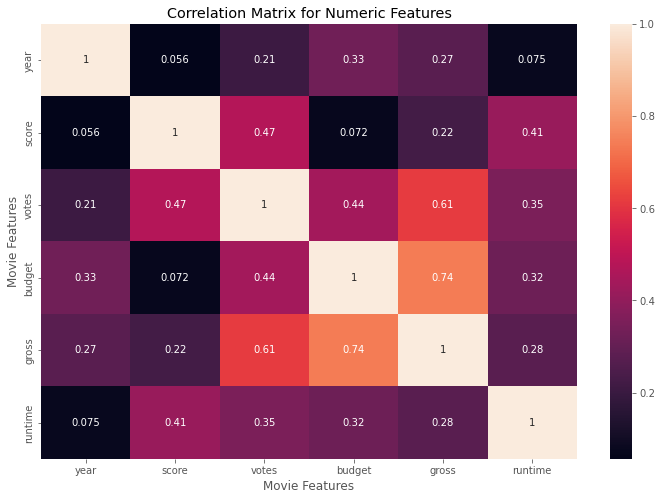

In [51]:
correlation_matric = df.corr(method='pearson')
sns.heatmap(correlation_matric, annot=True)
plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')

plt.show()

In [52]:
# Looks at Company

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000.0,2.847246e+09,Twentieth Century Fox,162.0,Dece
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000.0,2.797501e+09,Marvel Studios,181.0,Apri
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000.0,2.201647e+09,Twentieth Century Fox,194.0,Dece
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000.0,2.069522e+09,Lucasfilm,138.0,Dece
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000.0,2.048360e+09,Marvel Studios,149.0,Apri


In [53]:
df_numerized = df

for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name] = df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes
        
df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,386,5,0,2009,527,7.8,1100000.0,785,1263,1534,47,237000000.0,2.847246e+09,1382,162.0,7
7445,388,5,0,2019,137,8.4,903000.0,105,513,1470,47,356000000.0,2.797501e+09,983,181.0,5
3045,4909,5,6,1997,534,7.8,1100000.0,785,1263,1073,47,200000000.0,2.201647e+09,1382,194.0,7
6663,3643,5,0,2015,529,7.8,876000.0,768,1806,356,47,245000000.0,2.069522e+09,945,138.0,7
7244,389,5,0,2018,145,8.4,897000.0,105,513,1470,47,321000000.0,2.048360e+09,983,149.0,5
7480,4388,4,2,2019,1126,6.9,222000.0,1012,1361,457,47,260000000.0,1.670728e+09,1423,118.0,10
6653,2117,5,0,2015,1303,7.0,593000.0,335,2523,293,47,150000000.0,1.670516e+09,1397,124.0,11
6043,3878,5,0,2012,1899,8.0,1300000.0,1060,1646,1470,47,220000000.0,1.518816e+09,983,143.0,13
6646,1541,5,0,2015,165,7.1,370000.0,809,481,1785,47,190000000.0,1.515341e+09,1397,137.0,5
7494,1530,4,2,2019,2053,6.8,148000.0,277,1383,1036,47,150000000.0,1.450027e+09,1422,103.0,14


In [55]:
correlation_mat = df_numerized.corr()
corr_pairs = correlation_mat.unstack()
corr_pairs

name         name           1.000000
             rating        -0.029234
             genre          0.010996
             year           0.025542
             released      -0.006152
             score          0.014450
             votes          0.012615
             director       0.015246
             writer         0.012880
             star          -0.006882
             country       -0.025490
             budget         0.023392
             gross          0.005639
             company        0.021697
             runtime        0.010850
             yearcorrect   -0.007371
rating       name          -0.029234
             rating         1.000000
             genre          0.147796
             year           0.019499
             released       0.018083
             score          0.065983
             votes          0.006031
             director       0.014656
             writer        -0.003149
             star           0.009196
             country        0.008230
 

In [57]:
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

budget       genre         -0.368523
genre        budget        -0.368523
gross        genre         -0.244101
genre        gross         -0.244101
rating       budget        -0.203946
budget       rating        -0.203946
rating       gross         -0.181906
gross        rating        -0.181906
votes        genre         -0.135990
genre        votes         -0.135990
rating       company       -0.092357
company      rating        -0.092357
year         genre         -0.073167
genre        year          -0.073167
             company       -0.071334
company      genre         -0.071334
country      year          -0.066748
year         country       -0.066748
runtime      genre         -0.059237
genre        runtime       -0.059237
country      score         -0.043051
score        country       -0.043051
budget       writer        -0.039466
writer       budget        -0.039466
director     year          -0.038354
year         director      -0.038354
gross        writer        -0.035885
w

In [59]:
# We can now take a look at the ones that have a high correlation (> 0.5)

high_corr = sorted_pairs[abs(sorted_pairs) > 0.5]
high_corr

gross        votes          0.614751
votes        gross          0.614751
budget       gross          0.740247
gross        budget         0.740247
yearcorrect  released       0.996181
released     yearcorrect    0.996181
name         name           1.000000
company      company        1.000000
gross        gross          1.000000
budget       budget         1.000000
country      country        1.000000
star         star           1.000000
writer       writer         1.000000
director     director       1.000000
votes        votes          1.000000
score        score          1.000000
released     released       1.000000
year         year           1.000000
genre        genre          1.000000
rating       rating         1.000000
runtime      runtime        1.000000
yearcorrect  yearcorrect    1.000000
dtype: float64

In [60]:
# Looking at the top 15 compaies by gross revenue

CompanyGrossSum = df.groupby('company')[["gross"]].sum()

CompanyGrossSumSorted = CompanyGrossSum.sort_values('gross', ascending = False)[:15]

CompanyGrossSumSorted = CompanyGrossSumSorted['gross'].astype('int64') 

CompanyGrossSumSorted

company
1426    54610959970
1397    51241105418
452     42356430218
1108    40021704691
1382    39542573303
1423    35833650748
1044    19612851164
983     15065592411
550     11873612858
551     11593807697
1367    10664679494
1001     8937010092
1309     8318570396
1134     7886344526
682      7243673721
Name: gross, dtype: int64

In [61]:
df['Year'] = df['released'].astype(str).str[:4]
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect,Year
5445,386,5,0,2009,527,7.8,1100000.0,785,1263,1534,47,237000000.0,2.847246e+09,1382,162.0,7,527
7445,388,5,0,2019,137,8.4,903000.0,105,513,1470,47,356000000.0,2.797501e+09,983,181.0,5,137
3045,4909,5,6,1997,534,7.8,1100000.0,785,1263,1073,47,200000000.0,2.201647e+09,1382,194.0,7,534
6663,3643,5,0,2015,529,7.8,876000.0,768,1806,356,47,245000000.0,2.069522e+09,945,138.0,7,529
7244,389,5,0,2018,145,8.4,897000.0,105,513,1470,47,321000000.0,2.048360e+09,983,149.0,5,145
7480,4388,4,2,2019,1126,6.9,222000.0,1012,1361,457,47,260000000.0,1.670728e+09,1423,118.0,10,1126
6653,2117,5,0,2015,1303,7.0,593000.0,335,2523,293,47,150000000.0,1.670516e+09,1397,124.0,11,1303
6043,3878,5,0,2012,1899,8.0,1300000.0,1060,1646,1470,47,220000000.0,1.518816e+09,983,143.0,13,1899
6646,1541,5,0,2015,165,7.1,370000.0,809,481,1785,47,190000000.0,1.515341e+09,1397,137.0,5,165
7494,1530,4,2,2019,2053,6.8,148000.0,277,1383,1036,47,150000000.0,1.450027e+09,1422,103.0,14,2053


In [62]:
df.groupby(['company', 'year'])[["gross"]].sum()

gross
company year              
0       2003  4.435093e+07
1       2019  1.934575e+08
2       1996  1.058000e+04
3       1996  1.298324e+08
        1999  8.742386e+07
4       1983  1.223263e+07
5       2003  4.928883e+06
6       2017  4.065640e+07
7       2014  5.883438e+07
8       2002  2.643490e+05
9       2019  1.228104e+08
10      2007  2.278398e+07
11      2004  6.942439e+07
12      2020  1.111055e+08
13      2014  4.129632e+07
        2018  4.114238e+07
14      1990  5.835247e+06
15      1994  1.702394e+06
16      2002  2.393206e+07
17      2009  2.045887e+07
18      2007  7.248490e+06
        2008  2.870518e+07
        2014  5.092129e+06
19      2016  6.781500e+05
        2018  1.977444e+08
20      1996  6.020933e+07
        1997  7.581243e+07
        2001  7.118650e+07
        2010  6.496260e+05
        2013  3.909596e+06
        2014  1.614593e+08
        2015  3.660674e+07
        2019  2.238656e+07
21      1999  8.408835e+06
22      2017  5.042014e+06
23      2007  9.669758e+06
24      2001  4.760014e+06
25      1999  1.339493e+08
26      1986  7.137502e+06
        1989  3.729544e+07
        1995  1.540344e+07
        1999  3.457378e+07
        2000  2.772812e+07
        2004  1.526951e+06
27      2007  9.580292e+07
28      1999  2.061280e+05
29      2000  3.033646e+06
30      1990  1.000597e+07
31      1990  2.019659e+08
32      2003  5.141166e+06
33      2002  8.069354e+07
34      1995  3.734870e+06
        1996  4.962000e+04
        2002  1.494615e+07
35      1984  1.455045e+06
        1988  1.610040e+05
        1992  1.526697e+06
        1993  1.677807e+06
36      2014  3.686941e+07
        2016  7.255141e+07
        2018  2.365046e+07
        2019  4.796764e+07
37      1983  3.561561e+07
        1984  2.773433e+06
        1986  9.697739e+06
38      1990  3.496180e+05
39      2016  3.971200e+07
        2017  5.393930e+07
40      2005  1.269364e+07
41      1989  6.787800e+04
42      1984  5.206679e+07
        1998  1.263279e+06
43      2013  1.749682e+07
44      2014  2.541915e+07
45      1980  2.144878e+07
        1981  2.524463e+07
46      2012  5.277766e+06
47      2000  2.248346e+08
        2005  1.941371e+08
        2006  1.782816e+08
48      1989  3.169719e+06
49      1987  3.685862e+06
50      2008  8.706693e+07
51      2013  1.456675e+06
52      2012  1.164716e+08
53      1988  4.192440e+06
54      2017  4.398082e+07
55      2018  1.176791e+08
56      1987  3.090264e+07
        1989  1.877618e+06
57      2012  1.386088e+06
58      2011  3.242802e+06
59      1983  1.748856e+07
60      1996  7.497410e+05
        1997  1.278275e+07
61      1992  5.378172e+06
62      2019  3.802610e+07
63      2013  1.180643e+07
64      1997  1.279230e+05
65      2013  1.817693e+08
66      1994  7.638470e+05
67      1999  6.552255e+06
        2000  3.554776e+07
        2001  1.198113e+06
        2002  1.137588e+08
        2004  1.231332e+07
        2005  1.327684e+08
        2006  6.566472e+07
        2007  1.568353e+08
        2008  9.020017e+07
        2009  3.092083e+08
        2010  1.571078e+08
        2011  1.610438e+08
        2012  3.839002e+07
        2013  1.821788e+08
        2014  1.064356e+08
        2015  1.616907e+08
        2017  2.849358e+08
        2018  6.745082e+07
68      1992  9.569275e+06
        1993  4.676854e+07
        1995  2.344019e+07
69      2014  8.783566e+07
70      2012  7.029095e+06
71      2018  3.875590e+07
72      1987  1.418249e+07
        1988  1.300893e+07
        1989  1.655470e+07
        1991  1.193062e+06
73      1988  5.704187e+07
        1991  2.320244e+07
        2002  7.383924e+07
74      1997  1.477279e+07
75      2005  2.961214e+07
76      1989  4.973285e+06
77      2012  1.544989e+06
78      1997  2.804473e+06
        2001  1.288160e+07
        2002  6.413915e+06
        2003  1.271244e+06
79      1996  2.671291e+06
80      2013  2.785810e+07
81      1992  5.812422e+07
        1993  2.091546e+07
82      1995  1.038241e+07
83      1989  1.919653e+06
        1992  3.210082e+0

In [63]:
CompanyGrossSum = df.groupby(['company', 'year'])[["gross"]].sum()

CompanyGrossSumSorted = CompanyGrossSum.sort_values(['gross','company','year'], ascending = False)[:15]

CompanyGrossSumSorted = CompanyGrossSumSorted['gross'].astype('int64') 

CompanyGrossSumSorted

company  year
1423     2019    5773131804
983      2018    4018631866
1397     2015    3834354888
1382     2009    3793491246
1423     2017    3789382071
1108     2011    3565705182
1426     2011    3223799224
1423     2010    3104474158
1108     2014    3071298586
452      2006    2934631933
         2019    2932757449
983      2019    2797501328
1426     2018    2774168962
452      2011    2738363306
1426     2005    2688767210
Name: gross, dtype: int64

In [64]:
CompanyGrossSum = df.groupby(['company'])[["gross"]].sum()

CompanyGrossSumSorted = CompanyGrossSum.sort_values(['gross','company'], ascending = False)[:15]

CompanyGrossSumSorted = CompanyGrossSumSorted['gross'].astype('int64') 

CompanyGrossSumSorted

company
1426    54610959970
1397    51241105418
452     42356430218
1108    40021704691
1382    39542573303
1423    35833650748
1044    19612851164
983     15065592411
550     11873612858
551     11593807697
1367    10664679494
1001     8937010092
1309     8318570396
1134     7886344526
682      7243673721
Name: gross, dtype: int64

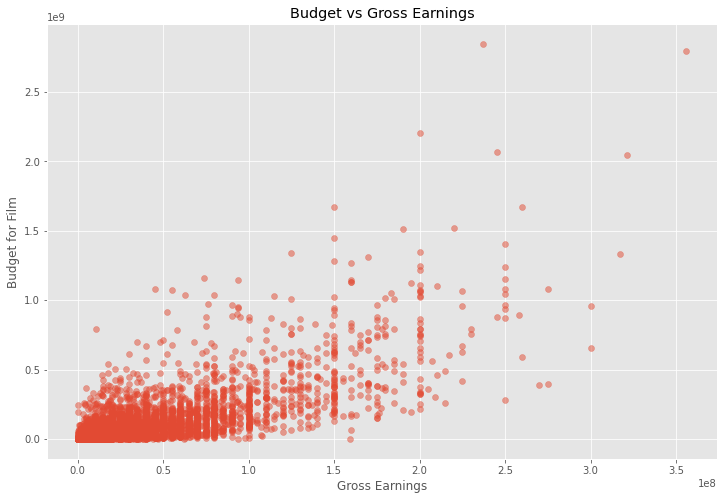

In [65]:
plt.scatter(x=df['budget'], y=df['gross'], alpha=0.5)
plt.title('Budget vs Gross Earnings')
plt.xlabel('Gross Earnings')
plt.ylabel('Budget for Film')
plt.show()

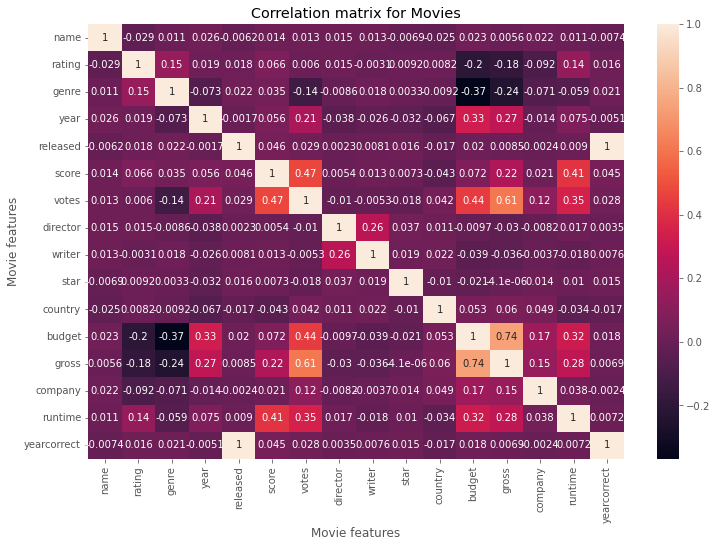

In [66]:
correlation_matrix = df_numerized.corr(method='pearson')

sns.heatmap(correlation_matrix, annot = True)

plt.title("Correlation matrix for Movies")

plt.xlabel("Movie features")

plt.ylabel("Movie features")

plt.show()

<AxesSubplot:xlabel='rating', ylabel='gross'>

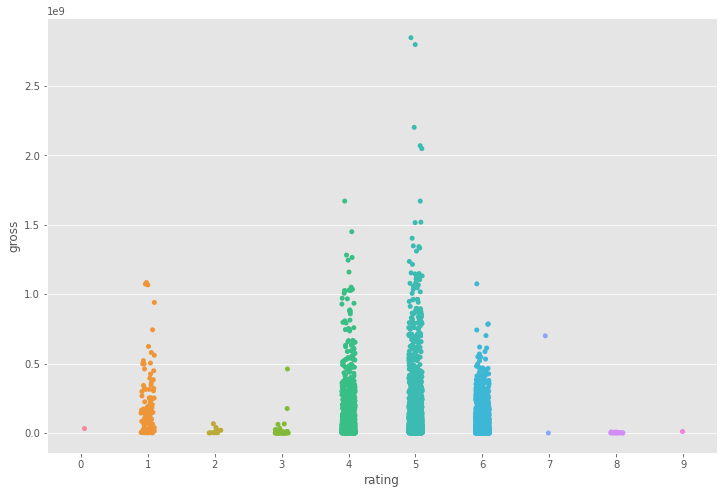

In [69]:
# Votes and budget have the highest correlation to gross earnings

# Company has low correlation

<AxesSubplot:xlabel='rating', ylabel='gross'>

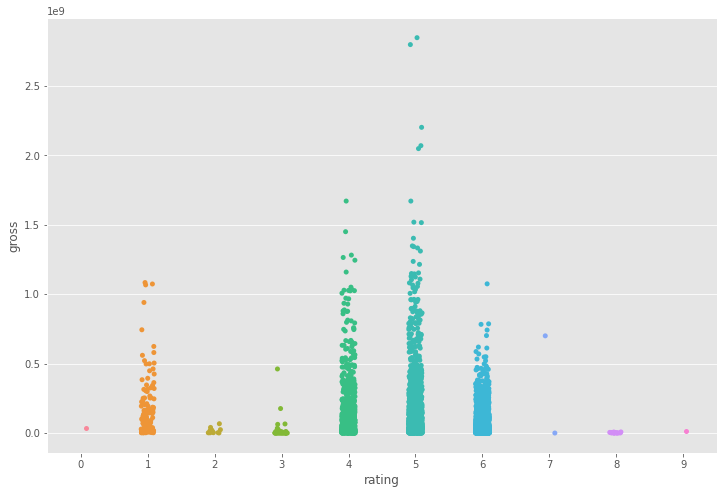